In this notebook, I used **Spark cluster** to explore the large  page_views.csv dataset and analyze its relationship with events.csv.

This notebook answer questions like:

Q1. How to join page_views.csv and events.csv?

Q2. Is events.csv a subset of page_views.csv?

Q3. Are there additional page views for users in events.csv?

In [ ]:
!pip -q install pyspark flasgger

     |████████████████████████████████| 281.3 MB 37 kB/s 
     |████████████████████████████████| 3.8 MB 43.2 MB/s 
     |████████████████████████████████| 198 kB 54.4 MB/s 
     |████████████████████████████████| 71 kB 199 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
nbclient 0.5.9 requires jupyter-client>=6.1.5, but you have jupyter-client 5.3.5 which is incompatible.


In [ ]:
import plotly.express as px
from pyspark.sql import SparkSession, functions as f
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## **Analyzing Page Views**

**Loading page_views.csv** 

In [ ]:
from google.colab import files
files.upload()

Saving page_views_sample.csv to page_views_sample (2).csv


{'page_views_sample.csv': b'uuid,document_id,timestamp,platform,geo_location,traffic_source\r\n1fd5f051fba643,120,31905835,1,RS,2\r\n8557aa9004be3b,120,32053104,1,VN>44,2\r\nc351b277a358f0,120,54013023,1,KR>12,1\r\n8205775c5387f9,120,44196592,1,IN>16,2\r\n9cb0ccd8458371,120,65817371,1,US>CA>807,2\r\n2aa611f32875c7,120,71495491,1,CA>ON,2\r\nf55a6eaf2b34ab,120,73309199,1,BR>27,2\r\ncc01b582c8cbff,120,50033577,1,CA>BC,2\r\n6c802978b8dd4d,120,66590306,1,CA>ON,2\r\nf4e423314303ff,120,48314254,1,US>LA>622,1\r\n3937372ca2709b,120,24360074,1,NO,2\r\n31f8d101c6a851,120,13847456,1,PH>D9,2\r\n67606983fe1acf,984,82129416,2,US>OK>671,2\r\n3f9d5b09ac4a0a,984,82583638,2,US,2\r\n3dd8a359aa8699,984,59439284,2,US>MD>511,2\r\n95e966c81b9316,984,983791,3,US>AL>698,2\r\n483cf1feb3e47c,984,17944009,2,US>MI>505,1\r\nf7baf0caf201ca,984,37096677,2,CA>AB,2\r\n7a408fe90c02b3,984,30457643,1,PH,1\r\n9ee2877617838a,984,86093121,3,US>MN>613,2\r\n169ef864976827,984,66689335,2,US>MA>506,2\r\n39cb940573224b,984,7931383

In [ ]:
spark = SparkSession.builder.master('local[3]').appName('clicks_test').getOrCreate()

In [ ]:
page_views = spark.read.csv('page_views_sample.csv',inferSchema=True, header=True)

In [ ]:
page_views.printSchema()

root
 |-- uuid: string (nullable = true)
 |-- document_id: integer (nullable = true)
 |-- timestamp: integer (nullable = true)
 |-- platform: integer (nullable = true)
 |-- geo_location: string (nullable = true)
 |-- traffic_source: integer (nullable = true)



In [ ]:
page_views.rdd.getNumPartitions()

3

In [ ]:
%time page_views.show()

+--------------+-----------+---------+--------+------------+--------------+
|          uuid|document_id|timestamp|platform|geo_location|traffic_source|
+--------------+-----------+---------+--------+------------+--------------+
|1fd5f051fba643|        120| 31905835|       1|          RS|             2|
|8557aa9004be3b|        120| 32053104|       1|       VN>44|             2|
|c351b277a358f0|        120| 54013023|       1|       KR>12|             1|
|8205775c5387f9|        120| 44196592|       1|       IN>16|             2|
|9cb0ccd8458371|        120| 65817371|       1|   US>CA>807|             2|
|2aa611f32875c7|        120| 71495491|       1|       CA>ON|             2|
|f55a6eaf2b34ab|        120| 73309199|       1|       BR>27|             2|
|cc01b582c8cbff|        120| 50033577|       1|       CA>BC|             2|
|6c802978b8dd4d|        120| 66590306|       1|       CA>ON|             2|
|f4e423314303ff|        120| 48314254|       1|   US>LA>622|             1|
|3937372ca27

## **Page views timestamp stats**

In [ ]:
%time page_views_timestamp_stats_df = page_views.describe('timestamp')

CPU times: user 8.33 ms, sys: 0 ns, total: 8.33 ms
Wall time: 789 ms


In [ ]:
page_views_timestamp_stats = page_views_timestamp_stats_df.rdd.collectAsMap()
page_views_timestamp_stats

{'count': '285813',
 'max': '86399412',
 'mean': '4.626711156603793E7',
 'min': '96',
 'stddev': '2.0184691969333373E7'}

In [ ]:
page_views_count = int(page_views_timestamp_stats['count'])
print('# Page Views:',page_views_count)

# Page Views: 285813


In [ ]:
from datetime import datetime
def convert_odd_timestamp(timestamp_ms_relative):
    TIMESTAMP_DELTA=1465876799998
    return datetime.fromtimestamp((int(timestamp_ms_relative)+TIMESTAMP_DELTA)//1000)

In [ ]:
print(convert_odd_timestamp(page_views_timestamp_stats['min']))

2016-06-14 04:00:00


In [ ]:
print(convert_odd_timestamp(page_views_timestamp_stats['max']))

2016-06-15 03:59:59


## **Page views by user**

In [ ]:
import pandas as pd


In [ ]:
#Grouping page views by user id and aggregating the count by user
page_views_by_user_df = page_views.groupBy('uuid').count()

In [ ]:
#Grouping page views user counts by counts (to build a histogram)
page_views_user_distribution_df = page_views_by_user_df.select('count').groupby('count').count()

In [ ]:
#Converting the PySpark Dataframe to a Pandas Dataframe (for plotting)
page_views_by_user_pandas = page_views_user_distribution_df.toPandas()

In [ ]:
len(page_views_by_user_pandas)

2

In [ ]:
page_views_by_user_pandas.columns = ['pageViewsByUser', 'usersCount']
page_views_by_user_pandas = page_views_by_user_pandas.set_index('pageViewsByUser').sort_index()
page_views_by_user_pandas.head(2)

,usersCount
pageViewsByUser,
1,285400
2,207


In [ ]:
distinct_users_count = page_views_by_user_pandas['usersCount'].sum()
distinct_users_count

285607

In [ ]:
avg_page_views_by_user = page_views_count / float(distinct_users_count)
avg_page_views_by_user

1.0007212708371993

The Average page views by user indicates that we have lower average (1.007) in page views dataset, when compared to the events dataset (10.863). 

Average events by user is calculated in the code below



In [ ]:
%matplotlib inline

Plotting the number of users (y axis) by the count of their page views (x axis)

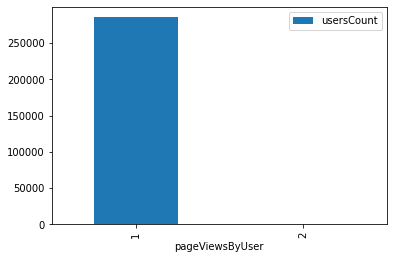

In [ ]:
page_views_by_user_pandas.head(20).plot.bar(y='usersCount')

Calculating the cumulative percentual of users with at most N page views

In [ ]:
page_views_by_user_pandas['cum_perc'] = (page_views_by_user_pandas['usersCount'].cumsum() / distinct_users_count) * 100

In [ ]:
page_views_by_user_pandas.head(2)

,usersCount,cum_perc
pageViewsByUser,,
1,285400,99.927523
2,207,100.000000


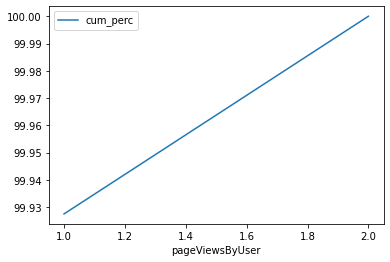

In [ ]:
page_views_by_user_pandas.head(20).plot.line(y='cum_perc')

In [ ]:
page_views_by_user_pandas.tail(2)

,count,count
0,1,285400
1,2,207


## **Loading events.csv**

In [ ]:
from google.colab import files
files.upload()

Saving events.csv to events.csv


{'events.csv': b'display_id,uuid,document_id,timestamp,platform,geo_location\r\n1,cb8c55702adb93,379743,61,3,US>SC>519\r\n2,79a85fa78311b9,1794259,81,2,US>CA>807\r\n3,822932ce3d8757,1179111,182,2,US>MI>505\r\n4,85281d0a49f7ac,1777797,234,2,US>WV>564\r\n5,8d0daef4bf5b56,252458,338,2,SG>00\r\n6,7765b4faae4ad4,1773517,395,3,US>OH>510\r\n7,2cc3f6457d16da,1149661,602,2,US>MT>762\r\n8,166fc654d73c98,1330329,638,2,US>PA>566\r\n9,9dddccf70f6067,1772126,667,1,US>FL>528\r\n10,b09a0e92aa4d17,157455,693,1,US\r\n11,602e210c5831e5,1773230,710,3,US>IL>675\r\n12,6fa993bd0e0157,892701,718,1,US>TX>612\r\n13,7355615832b3af,1778533,739,1,US>AZ>753\r\n14,daef797fc210a2,1759953,798,3,US>NC>560\r\n15,24c64dc30891c0,1777136,1000,2,GB\r\n16,30c0ad12b36375,1727882,1033,1,US>FL>561\r\n17,c80c06d718ba65,1667725,1044,2,US>MI>540\r\n18,eb58e66b4f6bb0,429183,1175,2,US>OR>820\r\n19,c419799a427c72,1155107,1202,3,US>HI>744\r\n20,650e3b5699738b,1642724,1282,2,US>MI>505\r\n21,95866cc26c177b,1771519,1394,2,US>NC>560\r\n22

In [ ]:
events_df = spark.read.csv('events.csv',inferSchema=True, header=True)

In [ ]:
events_df.rdd.getNumPartitions()

3

In [ ]:
events_df.show()

+----------+--------------+-----------+---------+--------+------------+
|display_id|          uuid|document_id|timestamp|platform|geo_location|
+----------+--------------+-----------+---------+--------+------------+
|         1|cb8c55702adb93|     379743|       61|       3|   US>SC>519|
|         2|79a85fa78311b9|    1794259|       81|       2|   US>CA>807|
|         3|822932ce3d8757|    1179111|      182|       2|   US>MI>505|
|         4|85281d0a49f7ac|    1777797|      234|       2|   US>WV>564|
|         5|8d0daef4bf5b56|     252458|      338|       2|       SG>00|
|         6|7765b4faae4ad4|    1773517|      395|       3|   US>OH>510|
|         7|2cc3f6457d16da|    1149661|      602|       2|   US>MT>762|
|         8|166fc654d73c98|    1330329|      638|       2|   US>PA>566|
|         9|9dddccf70f6067|    1772126|      667|       1|   US>FL>528|
|        10|b09a0e92aa4d17|     157455|      693|       1|          US|
|        11|602e210c5831e5|    1773230|      710|       3|   US>

**Events Count**

In [ ]:
%time events_count = events_df.count()
events_count

CPU times: user 6.97 ms, sys: 90 µs, total: 7.06 ms
Wall time: 925 ms


1048517

In [ ]:
from pyspark.sql.types import *
import pyspark.sql.functions as F

**Distinct users in events**

In [ ]:
%time distinct_events_users = events_df.agg(F.countDistinct("uuid").alias('count')).collect()[0]['count']
distinct_events_users

CPU times: user 23.3 ms, sys: 2.43 ms, total: 25.8 ms
Wall time: 2.69 s


96520

**Average events by user**

In [ ]:
avg_events_by_user = events_count / float(distinct_events_users)
avg_events_by_user

10.863209697472026

## **Exploring relationship of Page_views with Events**

**Creating a dummy columns on Page Views and Events datasets, which will be useful to filter matches in outer joins**

In [ ]:
page_views = page_views.withColumn('dummyPageView', F.lit(1))
events_df = events_df.withColumn('dummyEvent', F.lit(1))

**Performing a join between page views and events, on fields uuid and document_id**

In [ ]:
page_views_events_joined_by_uuid_document_df = page_views.alias('page_views').join(events_df.alias('events'), on=['uuid','document_id'], how='outer')


In [ ]:
%time page_views_events_joined_by_uuid_document_df.filter('dummyEvent is not null and dummyPageView is null').count()

CPU times: user 26.2 ms, sys: 3.45 ms, total: 29.7 ms
Wall time: 4.48 s


1048453

In [ ]:
page_view_events_matches_df = page_views_events_joined_by_uuid_document_df.filter('dummyPageView is not null and dummyEvent is not null')
%time page_view_events_matches_df.show(200)

+--------------+-----------+---------+--------+------------+--------------+-------------+----------+---------+--------+------------+----------+
|          uuid|document_id|timestamp|platform|geo_location|traffic_source|dummyPageView|display_id|timestamp|platform|geo_location|dummyEvent|
+--------------+-----------+---------+--------+------------+--------------+-------------+----------+---------+--------+------------+----------+
|4ffa570cda134c|      25792|  6120699|       1|   US>FL>539|             1|            1|     73445|  6120924|       1|   US>FL>539|         1|
|7063800e1ed16b|      25792|  5786653|       1|       DK>17|             1|            1|     70058|  5786653|       1|       DK>17|         1|
|aa61f366713537|      25792|  6021772|       1|   US>MI>505|             1|            1|     72414|  6021894|       1|   US>MI>505|         1|
|94138f0bbf1800|      25792|  6344983|       3|       GR>40|             1|            1|     75668|  6344983|       3|       GR>40|    

In [ ]:
diff_between_page_views_events_timestamps_udf = F.udf(lambda event_ts, page_view_ts: round(abs((convert_odd_timestamp(event_ts) - convert_odd_timestamp(page_view_ts)).total_seconds())), IntegerType())


**Analyzing delta between page views and events timestamps**

In [ ]:
page_view_events_matches_with_delta_ts_df = page_view_events_matches_df \
                                        .withColumn('timestamp_delta_secs', diff_between_page_views_events_timestamps_udf('events.timestamp', 'page_views.timestamp')) \
                                        .select('timestamp_delta_secs')
%time page_view_events_matches_with_delta_ts_df.describe('timestamp_delta_secs').show()

+-------+--------------------+
|summary|timestamp_delta_secs|
+-------+--------------------+
|  count|                  64|
|   mean|             318.875|
| stddev|  1031.4711254027823|
|    min|                   0|
|    max|                6223|
+-------+--------------------+

CPU times: user 27.4 ms, sys: 1.06 ms, total: 28.5 ms
Wall time: 4.05 s


In [ ]:
quantiles_levels = [0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.75]        
%time quantiles = page_view_events_matches_with_delta_ts_df.approxQuantile("timestamp_delta_secs", quantiles_levels, 0.05)
list(zip(quantiles_levels, quantiles))

CPU times: user 21.7 ms, sys: 2.22 ms, total: 23.9 ms
Wall time: 2.77 s


[(0.25, 0.0),
 (0.3, 0.0),
 (0.35, 0.0),
 (0.4, 0.0),
 (0.45, 0.0),
 (0.5, 0.0),
 (0.75, 1.0)]

**Performing the join on fields uuid, document_id, platform, geo_location and day(timestamp)**

In [ ]:
truncate_day_from_timestamp_udf = F.udf(lambda ts: int(ts / 1000 / 60 / 60 / 24), IntegerType())


In [ ]:
page_views_with_day_df = page_views.withColumn('day', truncate_day_from_timestamp_udf('timestamp')).withColumn('dummyPageView', F.lit(1))


In [ ]:
events_with_day_df = events_df.withColumn('day', truncate_day_from_timestamp_udf('timestamp')).withColumn('dummyEvent', F.lit(1))


**Now we join the datasets on fields uuid, document_id, platform, geo_location and day(timestamp).**

In [ ]:
page_views_events_with_day_joined_df = events_with_day_df.alias('events').join(page_views_with_day_df.alias('page_views'), on=['uuid','document_id','platform','geo_location','day'], how='left')


**Analyzing users' additional page views not in events**

In [ ]:
#Registering events dataset as a view, to use it in a SQL query
events_with_day_df.createOrReplaceTempView("EVENTS")    

#Registering "page_views left join events dataset" as a view, to use it in a SQL query
page_views_left_join_events_df = page_views_with_day_df.alias('page_views') \
                                        .join(events_with_day_df.alias('events'), 
                                              on=['uuid','document_id','platform','geo_location','day'], 
                                              how='left')
page_views_left_join_events_df.createOrReplaceTempView("PAGE_VIEWS_LEFT_JOIN_EVENTS")

#Grouping how many users have exactly N additional page views (which are not in events dataset, 
#                                                              but only from users in events dataset)
additional_page_views_by_user_df = spark.sql('''
            SELECT additionalPageViewsByUser, COUNT(*) as usersCount FROM
                (SELECT UUID, COUNT(*) as additionalPageViewsByUser 
                FROM PAGE_VIEWS_LEFT_JOIN_EVENTS p 
                WHERE dummyEvent IS NULL
                  AND EXISTS (SELECT uuid FROM EVENTS where uuid = p.uuid) 
                GROUP BY UUID)
            GROUP BY additionalPageViewsByUser''')

In [ ]:
%time additional_page_views_by_user_pandas = additional_page_views_by_user_df.toPandas()
additional_page_views_by_user_pandas = additional_page_views_by_user_pandas.set_index('additionalPageViewsByUser').sort_index()


CPU times: user 8.89 ms, sys: 1.92 ms, total: 10.8 ms
Wall time: 179 ms


There are 148 users in events dataset which have at least one additional page view (besides the ones logged as events), and 96372 users with no additional page view.

In [ ]:
users_with_additional_page_views_count = additional_page_views_by_user_pandas['usersCount'].sum()
users_with_additional_page_views_count

148

In [ ]:
users_without_additional_page_view = distinct_events_users - users_with_additional_page_views_count
users_without_additional_page_view

96372

# **Conclusion**

In this notebook, we leveraged the processing power of a Spark cluster, and explored page_views.csv dataset and its relationship with events.csv dataset.

We discovered that fields (uuid, document_id, platform, geo_location 
and day(timestamp)) can be used to effectivelly join both datasets. And events dataset can be considered to be a subset of page_views dataset.